# Esquema de compresión de Audio por medio de PCA

## José Carlos Escobar Gutiérrez
## 175895

In [1]:
from IPython.display import Audio
from scipy.io import wavfile

#samplerate, tabulasa = wavfile.read('/home/joe/Music/Skrillex/Bangarang/bangarang.wav')
samplerate, tabulasa = wavfile.read('/home/joe/Music/Skrillex/Bangarang/bangarang.wav')

start = samplerate * 25# 10 seconds in
end = start + samplerate * 10 # 5 second duration
Audio_orig = Audio(data=tabulasa[start:end, 0], rate=samplerate)
Audio_orig

/home/joe/Dev/venv/lib/python3.6/site-packages/scipy/io/wavfile.py:273: WavFileWarning: Chunk (non-data) not understood, skipping it.
  WavFileWarning)


In [2]:
from sklearn.decomposition import PCA
import numpy as np
import pylab as pl
import sys
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

def reducir_pca(signal, n_components, block_size=1024):
    
    # Hacemos un zero-pad de la señal para que sea divisible por el tamaño de bloque.
    # Simplemente agregamos zeros en los espacios que queden vacíos.
    samples = len(signal)
    hanging = block_size - np.mod(samples, block_size)
    padded = np.lib.pad(signal, (0, hanging), 'constant', constant_values=0)
    
    # Hacemos que ahora la señal tenga 1024 dimensiones.
    reshaped = padded.reshape((len(padded) // block_size, block_size))
    
    # Con esta funcion hacemos la parte de PCA.
    pca = PCA(n_components=n_components)
    pca.fit(reshaped)
    
    transformed = pca.transform(reshaped)
    reconstructed = pca.inverse_transform(transformed).reshape((len(padded)))
    return pca, transformed, reconstructed

Utilizando todos los componentes principales.

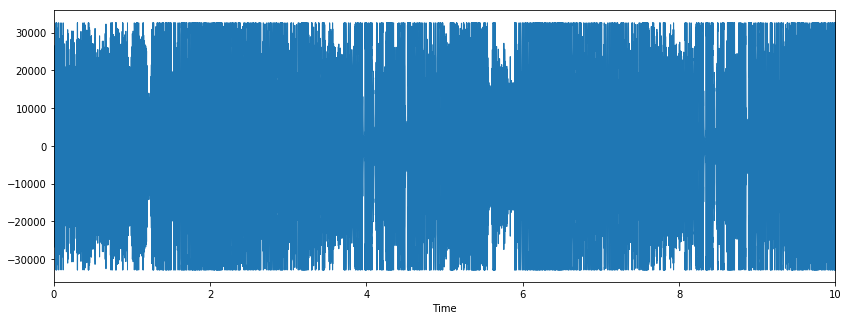

In [3]:
tabulasa_left = tabulasa[:,0]

pca_orig, transformed_orig, reconstructed_orig = reducir_pca(tabulasa_left, 1024, 1024)

Original = Audio(data=reconstructed_orig[start:end], rate=samplerate)
plt.figure(figsize=(14, 5))
librosa.display.waveplot(reconstructed_orig[start:end], sr=samplerate)
plt.show()

In [4]:
len(reconstructed_orig)

9493504

In [5]:
Original

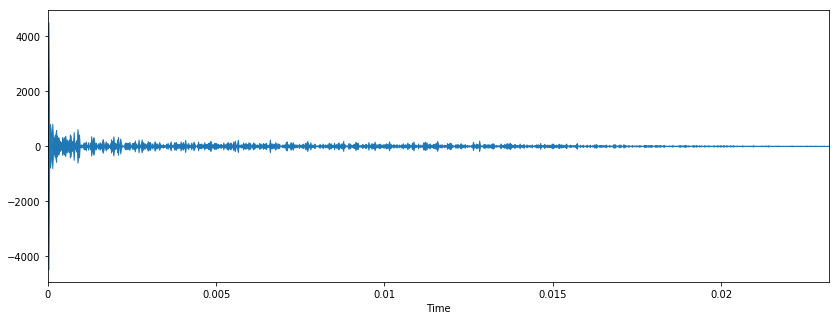

In [6]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(transformed_orig, sr=samplerate)
plt.show()

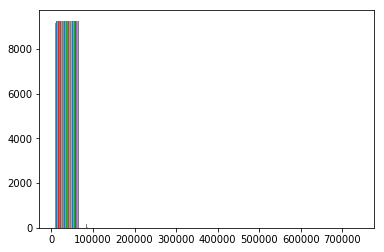

In [53]:
plt.hist(transformed_orig)
plt.show()

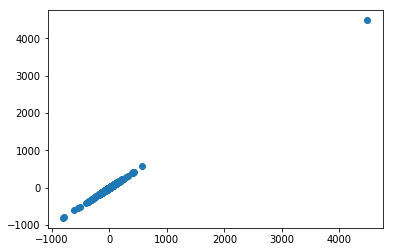

In [78]:
inputsig=transformed_orig
plt.scatter(x=inputsig[0],y=inputsig[1])
#plt.scatter(abs(transformed_orig),)
#plt.show()

In [8]:
print("Tamaño de la señal transformada con todos los componentes:",sys.getsizeof(transformed_orig))

Tamaño de la señal transformada con todos los componentes: 75948144


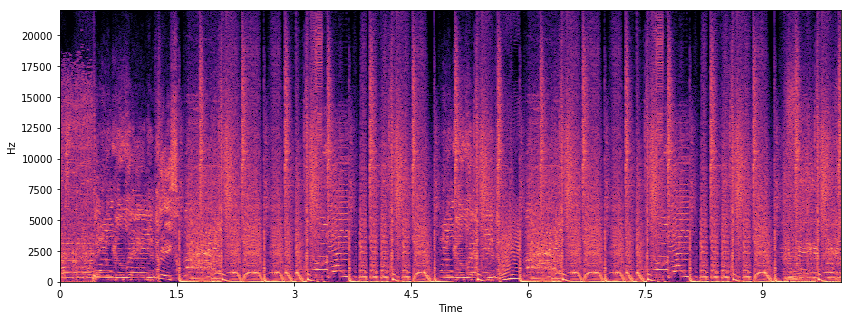

In [9]:
X_orig = librosa.stft(reconstructed_orig[start:end])
Xdb_orig = librosa.amplitude_to_db(abs(X_orig))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb_orig, sr=samplerate, x_axis='time', y_axis='hz')
plt.show()

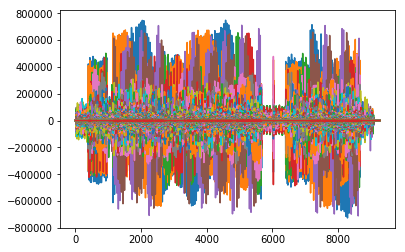

In [10]:
plt.plot(transformed_orig)
plt.show()

Utilizando la mitad de los componentes principales.

In [11]:
tabulasa_left = tabulasa[:,0]

pca_512, transformed_512, reconstructed_512 = reducir_pca(tabulasa_left, 512, 1024)

Comp_512 = Audio(data=reconstructed_512[start:end], rate=samplerate)
Comp_512

In [12]:
print("Tamaño de la señal transformada con la mitad de los componentes:",sys.getsizeof(transformed_512))

Tamaño de la señal transformada con la mitad de los componentes: 37974128


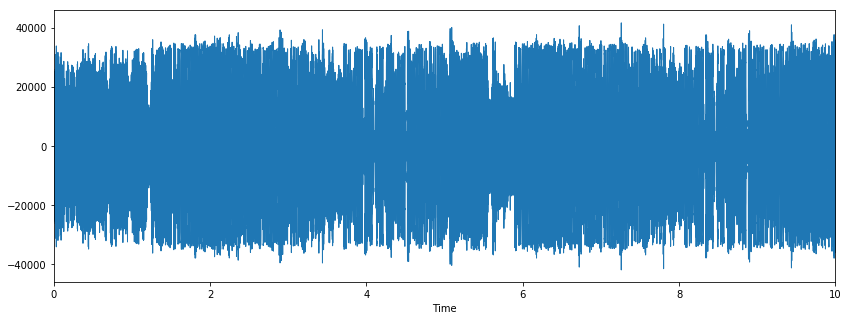

In [13]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(reconstructed_512[start:end], sr=samplerate)
plt.show()

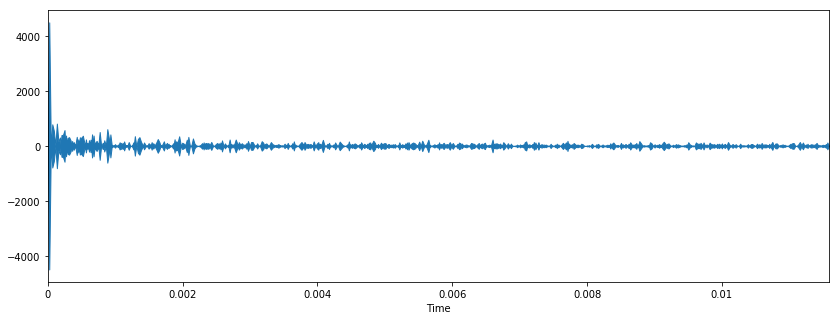

In [14]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(transformed_512, sr=samplerate)
plt.show()

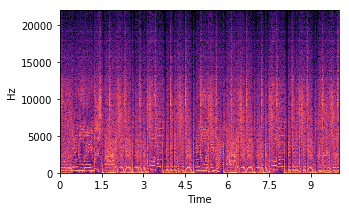

In [15]:
X_512 = librosa.stft(reconstructed_512[start:end])
Xdb_512 = librosa.amplitude_to_db(abs(X_512))
plt.figure(figsize=(5, 3))
librosa.display.specshow(Xdb_512, sr=samplerate, x_axis='time', y_axis='hz')
plt.show()

In [16]:
fft_512 = PCA(X_512)
#plt.lines(transformed_orig)
len(X_512) 
X_512.shape
#plt.show()

(1025, 862)

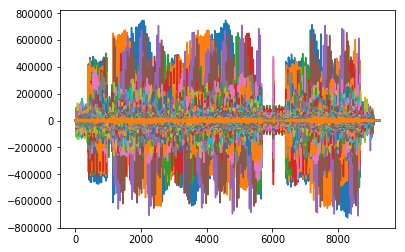

In [17]:
plt.plot(transformed_512)
plt.show()

Utilizando 1/64 de los componentes principales.

In [18]:
pca_16, transformed_16, reconstructed_16 = reducir_pca(tabulasa_left, 16, 1024)

Comp_16 = Audio(data=reconstructed_16[start:end], rate=samplerate)
Comp_16

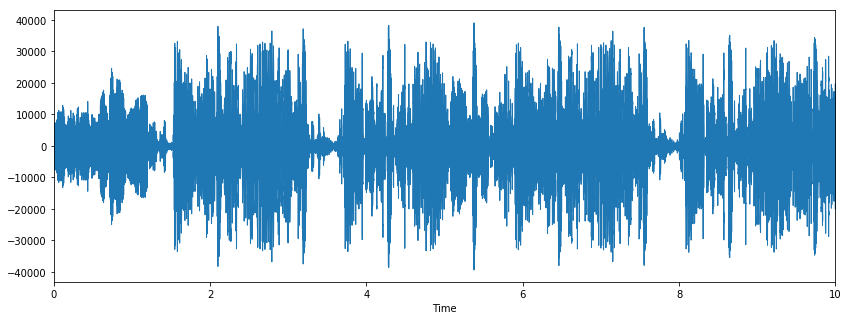

In [19]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(reconstructed_16[start:end], sr=samplerate)
plt.show()

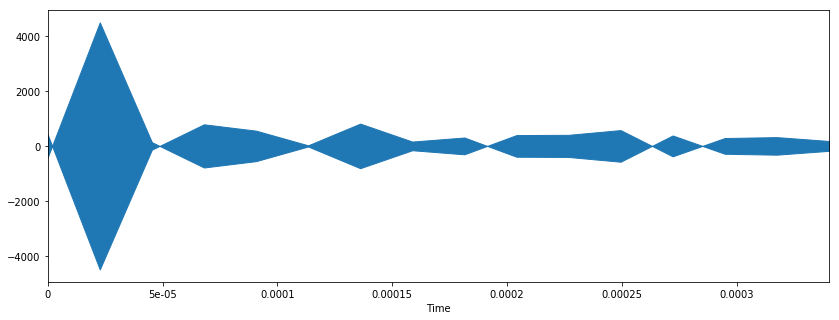

In [20]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(transformed_16, sr=samplerate)
plt.show()

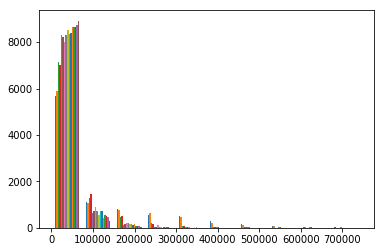

In [52]:
plt.hist(abs(transformed_16))
plt.show()

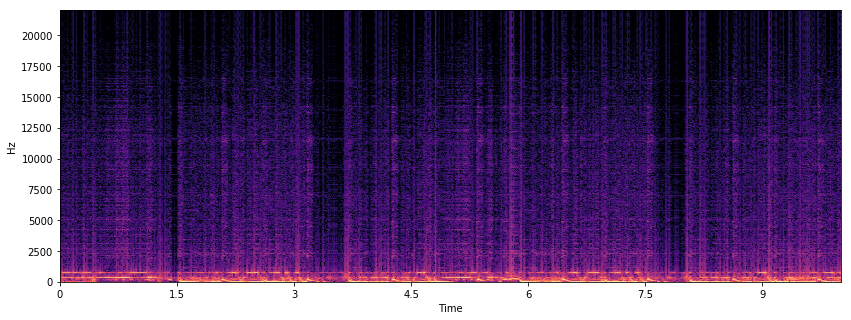

In [22]:
X_16 = librosa.stft(reconstructed_16[start:end])
Xdb_16 = librosa.amplitude_to_db(abs(X_16))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb_16, sr=samplerate, x_axis='time', y_axis='hz')
plt.show()

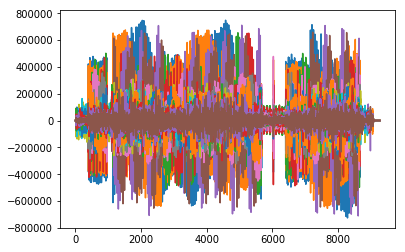

In [23]:
plt.plot(transformed_16)
plt.show()

In [24]:
fft_16 = PCA(X_16)
#plt.lines(transformed_orig)
len(X_16) 
type(X_16)
#type(fft_16.transform(reshaped))
#plt.show()

numpy.ndarray

In [25]:
print("Tamaño de la señal transformada con 16 componentes:",sys.getsizeof(transformed_16))

Tamaño de la señal transformada con 16 componentes: 1186800


Utilizando aprox el 20% de los componentes principales.

In [26]:
pca_204, transformed_204, reconstructed_204 = reducir_pca(tabulasa_left, 204, 1024)

Comp_204 = Audio(data=reconstructed_204[start:end], rate=samplerate)
Comp_204

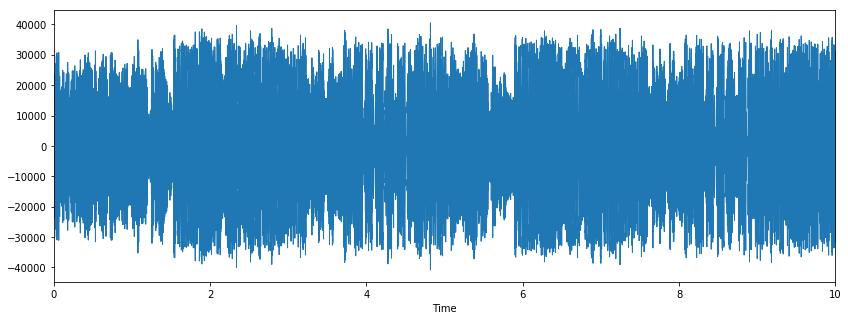

In [27]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(reconstructed_204[start:end], sr=samplerate)
plt.show()

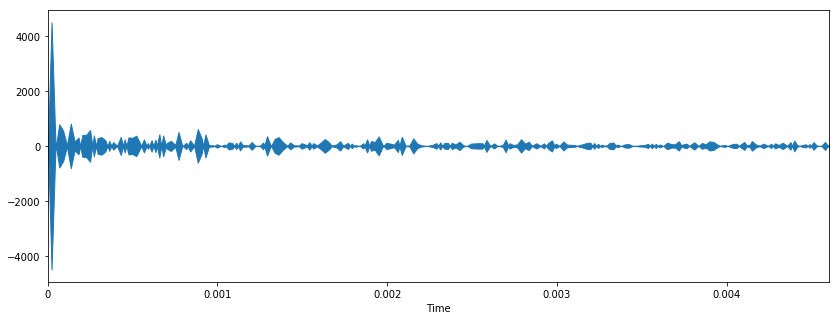

In [28]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(transformed_204, sr=samplerate)
plt.show()

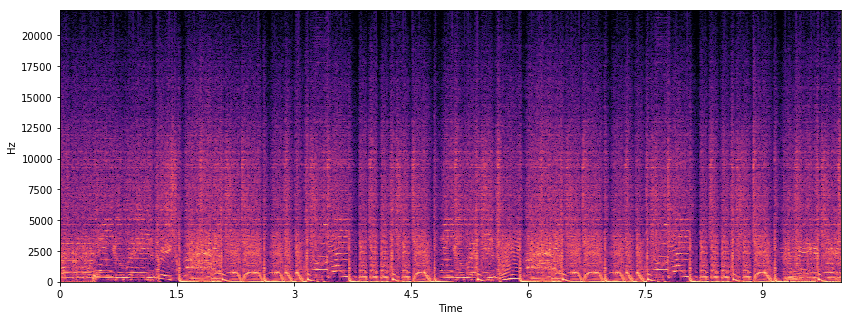

In [29]:
X_204 = librosa.stft(reconstructed_204[start:end])
Xdb_204 = librosa.amplitude_to_db(abs(X_204))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb_204, sr=samplerate, x_axis='time', y_axis='hz')
plt.show()

In [30]:
print("Tamaño de la señal transformada con 204 componentes:",sys.getsizeof(transformed_204))

Tamaño de la señal transformada con 204 componentes: 15130384


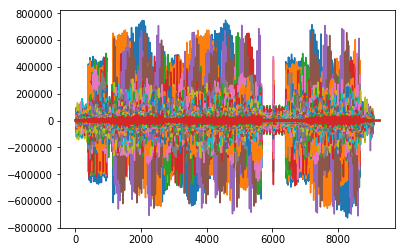

In [31]:
plt.plot(transformed_204)
plt.show()

In [32]:
diff_orig_vs_204 = reconstructed_orig - reconstructed_204
diff_orig_vs_204_aud = Audio(data=diff_orig_vs_204[start:end], rate=samplerate)
diff_orig_vs_204_aud

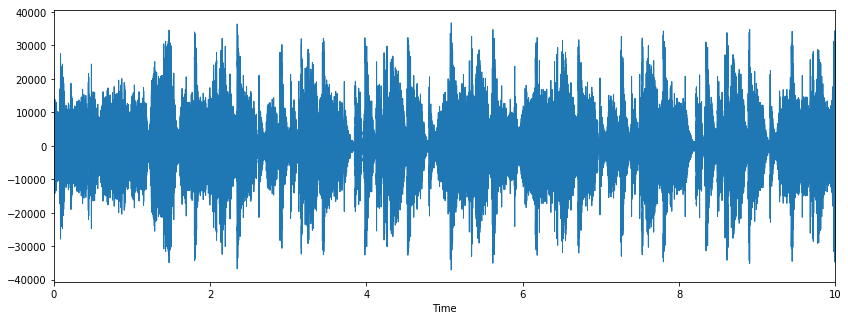

In [33]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(diff_orig_vs_204[start:end], sr=samplerate)
plt.show()

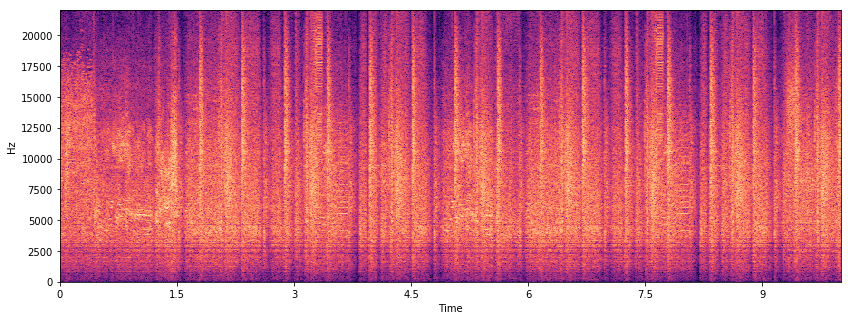

In [34]:
X_diff_orig_vs_204 = librosa.stft(diff_orig_vs_204[start:end])
Xdb_diff_orig_vs_204 = librosa.amplitude_to_db(abs(X_diff_orig_vs_204))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb_diff_orig_vs_204, sr=samplerate, x_axis='time', y_axis='hz')
plt.show()

In [35]:
diff_orig_vs_512 = reconstructed_orig - reconstructed_512
diff_orig_vs_512_aud = Audio(data=diff_orig_vs_512[start:end], rate=samplerate)
diff_orig_vs_512_aud

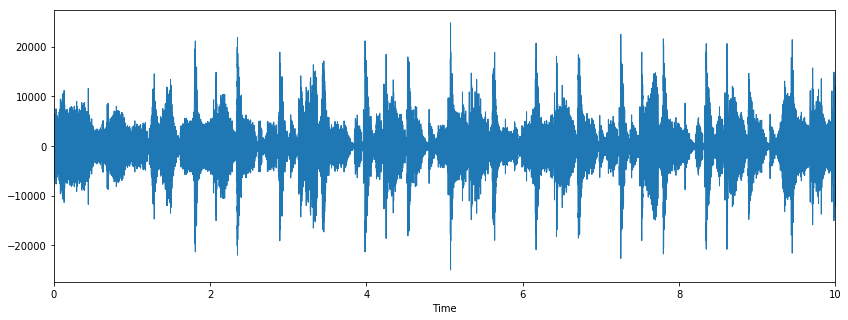

In [36]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(diff_orig_vs_512[start:end], sr=samplerate)
plt.show()

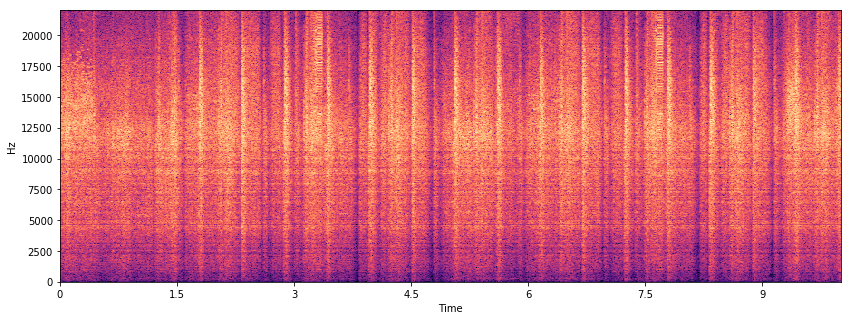

In [37]:
X_diff_orig_vs_512 = librosa.stft(diff_orig_vs_512[start:end])
Xdb_diff_orig_vs_512 = librosa.amplitude_to_db(abs(X_diff_orig_vs_512))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb_diff_orig_vs_512, sr=samplerate, x_axis='time', y_axis='hz')
plt.show()

<Figure size 1008x360 with 0 Axes>

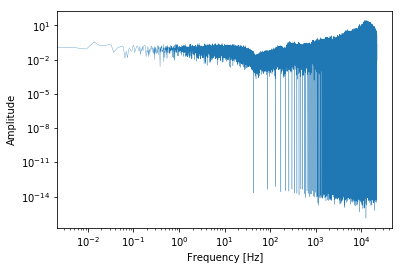

In [51]:
# fourier transform and frequency domain
#
signalin=diff_orig_vs_512
Fs=samplerate
N=len(signalin)
Y_k = np.fft.fft(signalin)[0:int(N/2)]/N # FFT function from numpy
Y_k[1:] = 2*Y_k[1:] # need to take the single-sided spectrum only
Pxx = np.abs(Y_k) # be sure to get rid of imaginary part

f = Fs*np.arange((N/2))/N; # frequency vector

# plotting
plt.figure(figsize=(14, 5))
fig,ax = plt.subplots()
plt.plot(f,Pxx,linewidth=0.3)
ax.set_xscale('log')
ax.set_yscale('log')
plt.ylabel('Amplitude')
plt.xlabel('Frequency [Hz]')
plt.show()


<Figure size 1008x360 with 0 Axes>

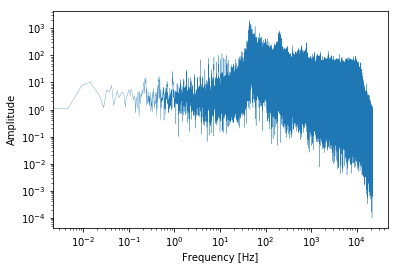

In [45]:
# fourier transform and frequency domain
#
Fs=samplerate
N=len(reconstructed_512)
Y_k = np.fft.fft(reconstructed_512)[0:int(N/2)]/N # FFT function from numpy
Y_k[1:] = 2*Y_k[1:] # need to take the single-sided spectrum only
Pxx = np.abs(Y_k) # be sure to get rid of imaginary part

f = Fs*np.arange((N/2))/N; # frequency vector

# plotting
plt.figure(figsize=(14, 5))
fig,ax = plt.subplots()
plt.plot(f,Pxx,linewidth=0.3)
ax.set_xscale('log')
ax.set_yscale('log')
plt.ylabel('Amplitude')
plt.xlabel('Frequency [Hz]')
plt.show()


<Figure size 1008x360 with 0 Axes>

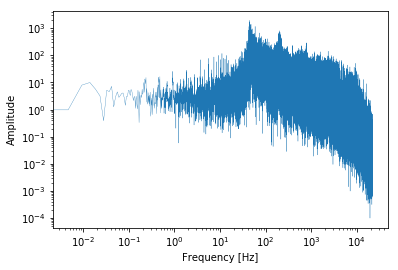

In [44]:
# fourier transform and frequency domain
#
Fs=samplerate
N=len(reconstructed_204)
Y_k = np.fft.fft(reconstructed_204)[0:int(N/2)]/N # FFT function from numpy
Y_k[1:] = 2*Y_k[1:] # need to take the single-sided spectrum only
Pxx = np.abs(Y_k) # be sure to get rid of imaginary part

f = Fs*np.arange((N/2))/N; # frequency vector

# plotting
plt.figure(figsize=(14, 5))
fig,ax = plt.subplots()
plt.plot(f,Pxx,linewidth=0.3)
ax.set_xscale('log')
ax.set_yscale('log')
plt.ylabel('Amplitude')
plt.xlabel('Frequency [Hz]')
plt.show()


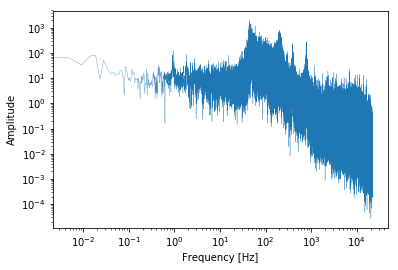

In [43]:
# fourier transform and frequency domain
#
Fs=samplerate
N=len(reconstructed_16)
Y_k = np.fft.fft(reconstructed_16)[0:int(N/2)]/N # FFT function from numpy
Y_k[1:] = 2*Y_k[1:] # need to take the single-sided spectrum only
Pxx = np.abs(Y_k) # be sure to get rid of imaginary part

f = Fs*np.arange((N/2))/N; # frequency vector

# plotting
fig,ax = plt.subplots()
plt.plot(f,Pxx,linewidth=0.3)
ax.set_xscale('log')
ax.set_yscale('log')
plt.ylabel('Amplitude')
plt.xlabel('Frequency [Hz]')
plt.show()
